<a href="https://colab.research.google.com/github/tamanna155/WildFire_Detection/blob/master/YOLOv11_WildFireDet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 33.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [2]:
from ultralytics import YOLO
from IPython.display import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!cp -r /content/drive/MyDrive/wildfire_dataset /content/

In [9]:
!yolo task=detect mode=train data=/content/wildfire_dataset/data.yaml model='yolo11n.pt' epochs=150 imgsz=640

Ultralytics 8.3.103 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/wildfire_dataset/data.yaml, epochs=150, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

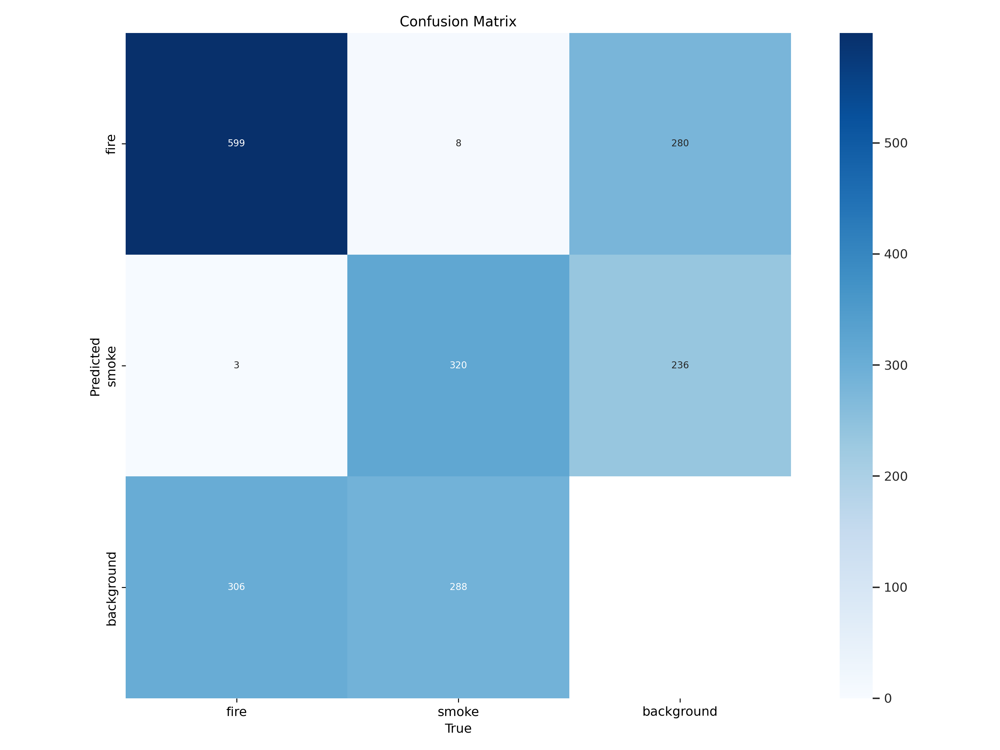

In [10]:
Image('/content/runs/detect/train2/confusion_matrix.png', width=600)

In [11]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

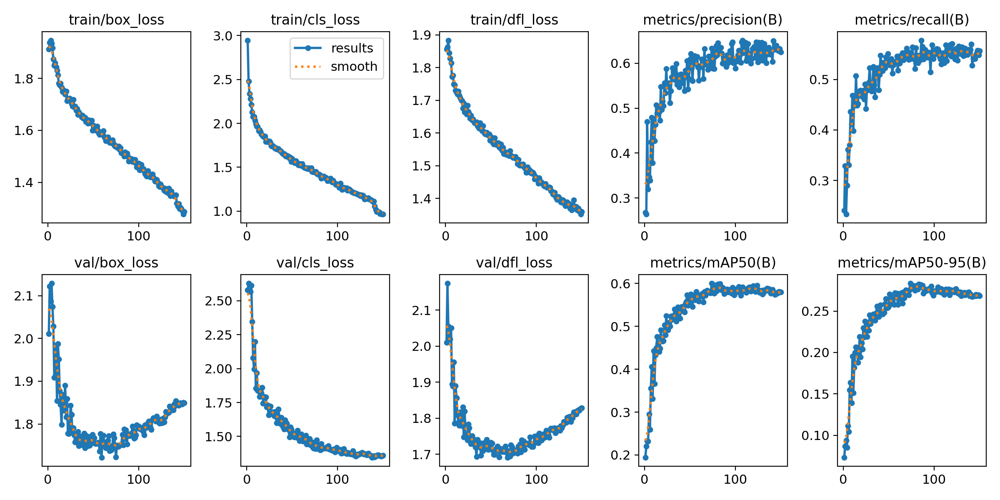

In [13]:

Image(filename='/content/runs/detect/train2/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


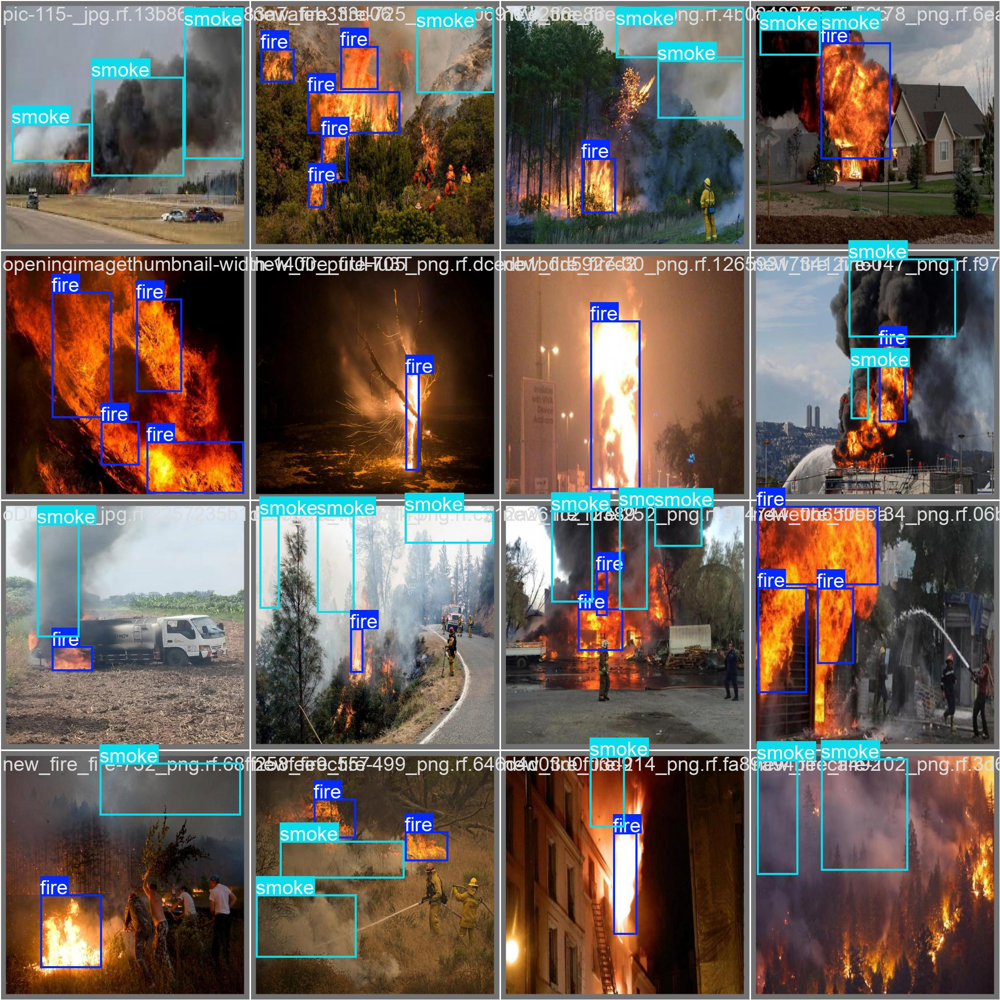

In [14]:
#first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/runs/detect/train2/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


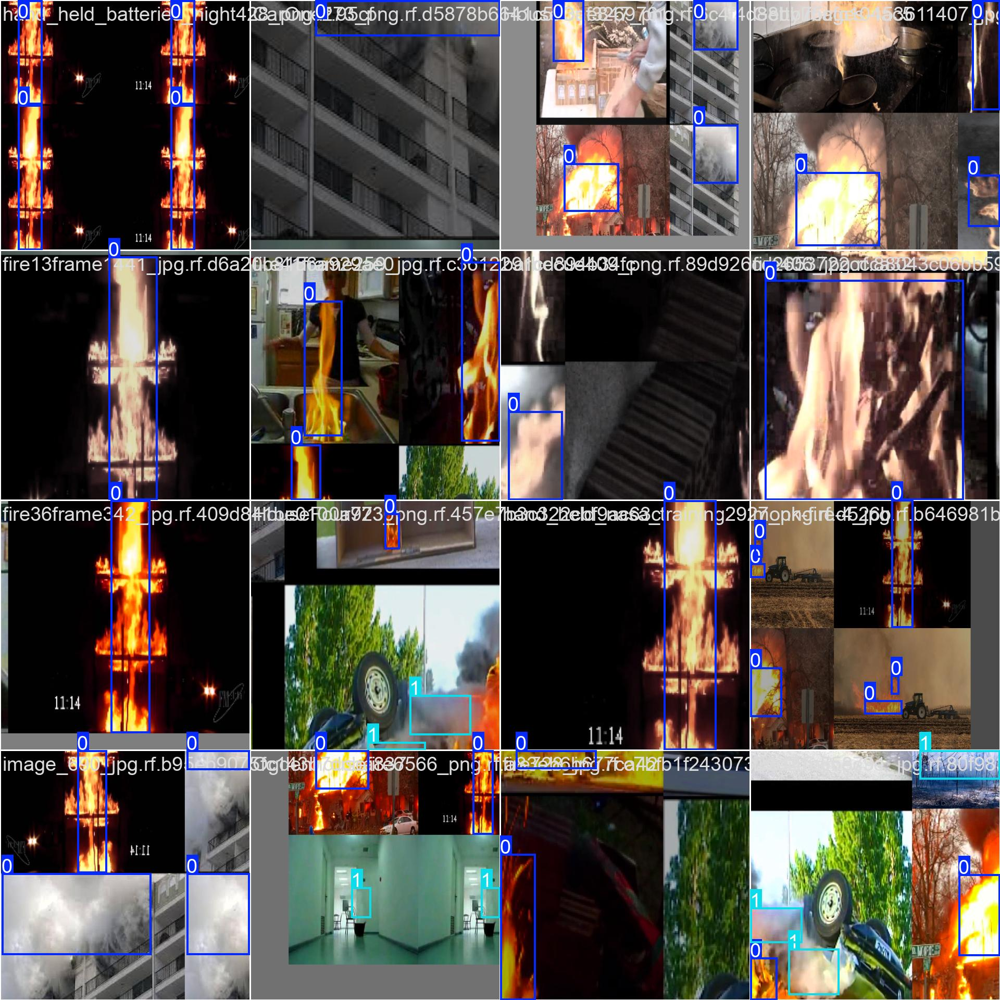

In [15]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/runs/detect/train2/train_batch0.jpg', width=900)

F1 Curve:


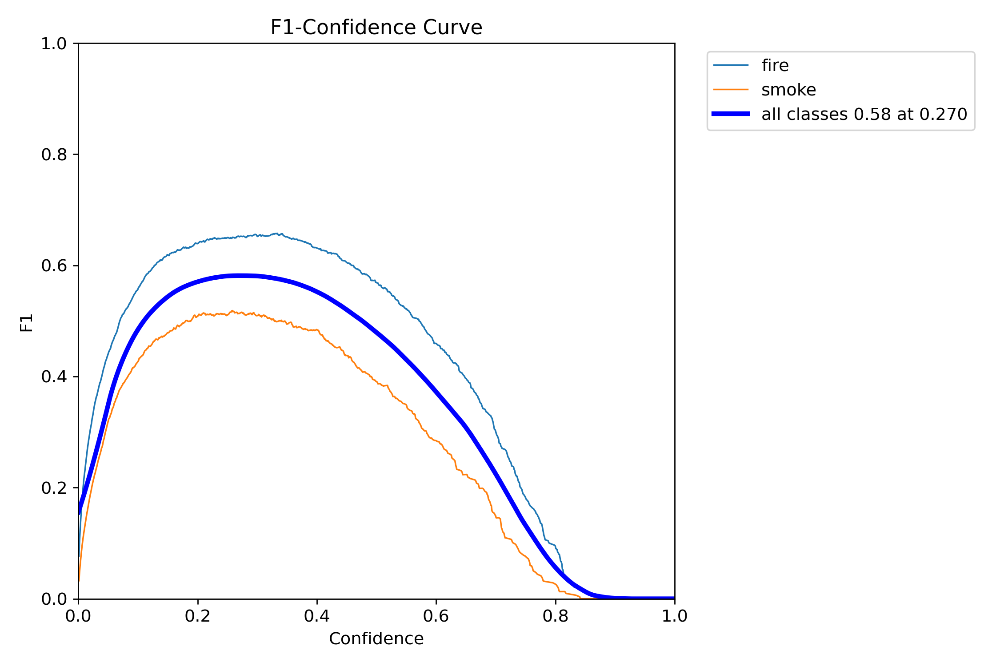

In [16]:
print("F1 Curve:")
Image(filename='/content/runs/detect/train2/F1_curve.png', width=900)

In [17]:
!yolo task=detect mode=val model='/content/runs/detect/train2/weights/best.pt' data=/content/wildfire_dataset/data.yaml

Ultralytics 8.3.103 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/wildfire_dataset/val/labels.cache... 728 images, 1 backgrounds, 0 corrupt: 100% 728/728 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 46/46 [00:08<00:00,  5.30it/s]
                   all        728       1524      0.622      0.551        0.6      0.283
                  fire        581        908       0.68      0.629      0.697      0.364
                 smoke        396        616      0.565      0.474      0.503      0.203
Speed: 0.5ms preprocess, 4.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [18]:
!yolo task=detect mode=predict model='/content/runs/detect/train2/weights/best.pt' conf=0.25 source=/content/wildfire_dataset/test/images save=True

Ultralytics 8.3.103 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/443 /content/wildfire_dataset/test/images/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg: 640x640 3 smokes, 12.0ms
image 2/443 /content/wildfire_dataset/test/images/00388_jpg.rf.4e0c55102c9c2a908dd0e53bf71902e5.jpg: 640x640 1 smoke, 11.4ms
image 3/443 /content/wildfire_dataset/test/images/01114_jpg.rf.a7e62bf264be7dc34d43eaa240026912.jpg: 640x640 2 fires, 8.5ms
image 4/443 /content/wildfire_dataset/test/images/0200-2_jpg.rf.69c14f36824ed579ef1c47f2854d3ec9.jpg: 640x640 2 smokes, 8.3ms
image 5/443 /content/wildfire_dataset/test/images/02910_jpg.rf.ce823c02374c25ca84cb80f6215918a9.jpg: 640x640 1 smoke, 11.9ms
image 6/443 /content/wildfire_dataset/test/images/07717_jpg.rf.d00a0945b5e7a9c5337ecdce97d075b7.jpg: 640x640 1 smoke, 12.4ms
image 7/443 /content/wildfire_dataset/test/images/08747_jpg.rf.77905cfd30b62fffd1c

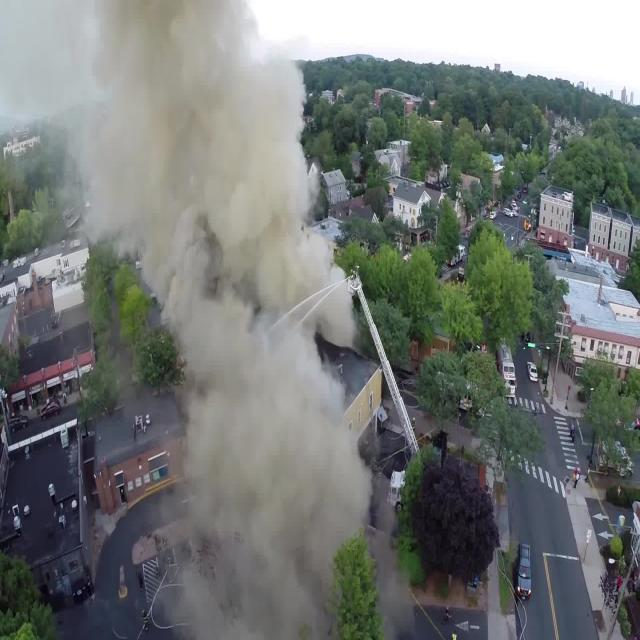

In [19]:
Image(filename='/content/wildfire_dataset/test/images/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg', width=1000)

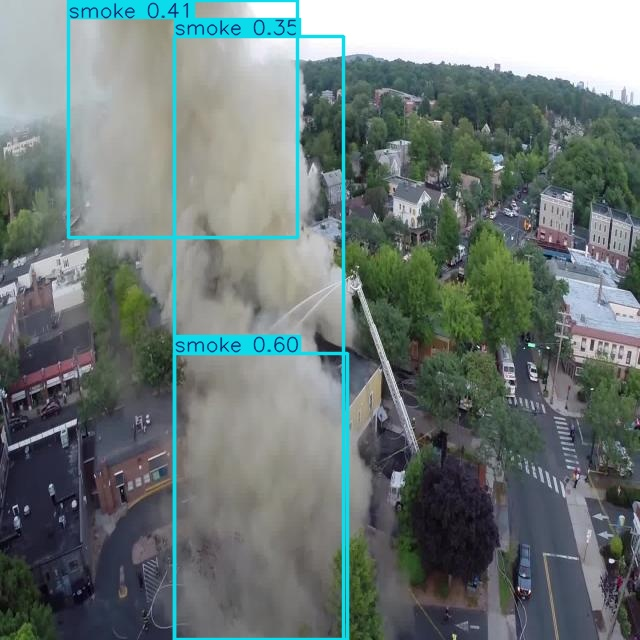

In [20]:
Image(filename='/content/runs/detect/predict/00271_jpg.rf.855daa53cdf70bb1ca89c238c9a9ee8a.jpg', width=1000)  # view results.png

In [21]:
!mkdir /content/my_model
!cp /content/runs/detect/train2/weights/best.pt /content/my_model/my_modelyolo11.pt
!cp -r /content/runs/detect/train2/ /content/my_model

In [24]:
%cd my_modelyolo11
!zip /content/my_modelyolo11.zip my_modelyolo11.pt
# !zip -r /content/my_modelyolo11.zip
# %cd /content

/content/my_modelyolo11
updating: my_modelyolo11.pt (deflated 10%)


In [25]:
from google.colab import files
files.download("/content/my_modelyolo11")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>